In [229]:
import pandas as pd
import numpy as np
import matplotlib
import networkx as nx

In [230]:
nodes = pd.read_csv("/Users/mayank/Documents/Online Political Polarization/followers1/nodes.csv", index_col=0)
edges = pd.read_csv("/Users/mayank/Documents/Online Political Polarization/followers1/edge_weights.csv", index_col=0)
edges = edges[:-1]
edges

,source,target,mention_weights,source_id,target_id
0,101779040,101215084,1,6,1
1,101779040,1061650831311745024,1,6,21
2,101779040,106513394,1,6,23
3,101779040,1094645942735855618,1,6,36
4,101779040,111944435,1,6,49
...,...,...,...,...,...
2173,968474905342763008,912211757363367936,1,613,589
2174,968474905342763008,91627522,1,613,590
2175,968474905342763008,948931678625456129,1,613,606
2176,968474905342763008,966486878546485250,1,613,612


In [237]:
x = ['101779040', '1111981876028137472', '1148627142843883520','1193474575436107776', '1229665429049638912', '1299906942',
       '135945073', '2155425056', '25376806', '2870988541', '3224312383',
       '384721399', '579964061', '797452062627950592',
       '806722023405723653', '87484569', '875297288704454656',
       '902446629617188864', '90804011', '968474905342763008']
x

['101779040',
 '1111981876028137472',
 '1148627142843883520',
 '1193474575436107776',
 '1229665429049638912',
 '1299906942',
 '135945073',
 '2155425056',
 '25376806',
 '2870988541',
 '3224312383',
 '384721399',
 '579964061',
 '797452062627950592',
 '806722023405723653',
 '87484569',
 '875297288704454656',
 '902446629617188864',
 '90804011',
 '968474905342763008']

In [238]:
color_map = ["green","green","green","blue","blue","green","green","blue","green","green","green","blue","green","blue","blue","blue","green","blue","blue","green"]

In [196]:
color = []
targetnode1 = []
for i in range(0,len(edges)):
    index = x.index(edges['source'][i])
    targetnode = edges['target'][i]
    targetnode1.append(targetnode)
    color.append(color_map[index])


In [197]:
df = pd.DataFrame({'node':targetnode1, 'color':color})
df

,node,color
0,101215084,green
1,1061650831311745024,green
2,106513394,green
3,1094645942735855618,green
4,111944435,green
...,...,...
2173,912211757363367936,green
2174,91627522,green
2175,948931678625456129,green
2176,966486878546485250,green


In [198]:
ab = df.groupby('node')['color'].apply(lambda x: x.unique()).reset_index()
ab

,node,color
0,151683,[green]
1,783214,"[green, blue]"
2,813286,[blue]
3,939091,"[blue, green]"
4,5120691,"[blue, green]"
...,...,...
600,1319677589305307136,[blue]
601,1330031041206161408,[green]
602,1331938183949414400,[green]
603,1341051026338586624,[blue]


In [199]:
color3= []
for i in range(0,len(df)):
    index = z.index(df['node'][i])
    if(df1['color2'][index]=='yellow'):
        color3.append('yellow')
    else:
        color3.append(df['color'][i])
df3 = pd.DataFrame({'target':targetnode1, 'color':color3})
df3

,target,color
0,101215084,yellow
1,1061650831311745024,green
2,106513394,green
3,1094645942735855618,yellow
4,111944435,green
...,...,...
2173,912211757363367936,green
2174,91627522,green
2175,948931678625456129,green
2176,966486878546485250,green


In [200]:
edges2 = pd.merge(edges, df3, on='target')
edges3 = edges2.drop_duplicates(subset=['target','source'])
edges3 = edges3.reset_index()
edges3
edges4 = edges2.drop_duplicates(subset=['target'])
edges4 = edges4.reset_index()
edges4

,index,source,target,mention_weights,source_id,target_id,color
0,0,101779040,101215084,1,6,1,yellow
1,16,101779040,1061650831311745024,1,6,21,green
2,41,101779040,106513394,1,6,23,green
3,57,101779040,1094645942735855618,1,6,36,yellow
4,73,101779040,111944435,1,6,49,green
...,...,...,...,...,...,...,...
600,8579,3224312383,147119511,1,381,196,green
601,8588,3224312383,2290764609,1,381,276,green
602,8597,3224312383,2597666894,1,381,321,yellow
603,8606,3224312383,3101452626,1,381,365,green


In [201]:
color2=[]
for i in range(0, len(ab)):
    if len(ab['color'][i]) > 1:
        color2.append("yellow")
    else:
        x = str(ab['color'][i])
        str1 = ''.join(x)
        color2.append(str1)

df1 = pd.DataFrame({'node':ab['node'], 'color':ab['color'], 'color2': color2})
y = list(df1['color'])
z = list(df1['node'])
       



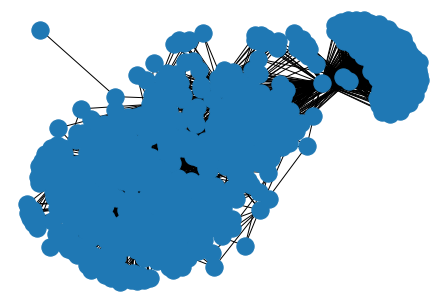

In [231]:
g = nx.from_pandas_edgelist(edges, source='source', target='target') 
nx.draw(g)

In [232]:
u_authors1 = edges3['source'].unique()
u_authors2 = edges3['target'].unique()
u_authors1

array(['101779040', '1111981876028137472', '1193474575436107776',
       '384721399', '135945073', '3224312383', '875297288704454656',
       '2870988541', '1229665429049638912', '579964061', '1299906942',
       '87484569', '902446629617188864', '1148627142843883520',
       '797452062627950592', '25376806', '90804011', '2155425056',
       '968474905342763008', '806722023405723653'], dtype=object)

In [236]:
subs = list(edges.source.unique()) # Make list of unique subreddits to use in network graph
subs1 = list(edges.target.unique())
subs

['101779040',
 '1111981876028137472',
 '1148627142843883520',
 '1193474575436107776',
 '1229665429049638912',
 '1299906942',
 '135945073',
 '2155425056',
 '25376806',
 '2870988541',
 '3224312383',
 '384721399',
 '579964061',
 '797452062627950592',
 '806722023405723653',
 '87484569',
 '875297288704454656',
 '902446629617188864',
 '90804011',
 '968474905342763008']

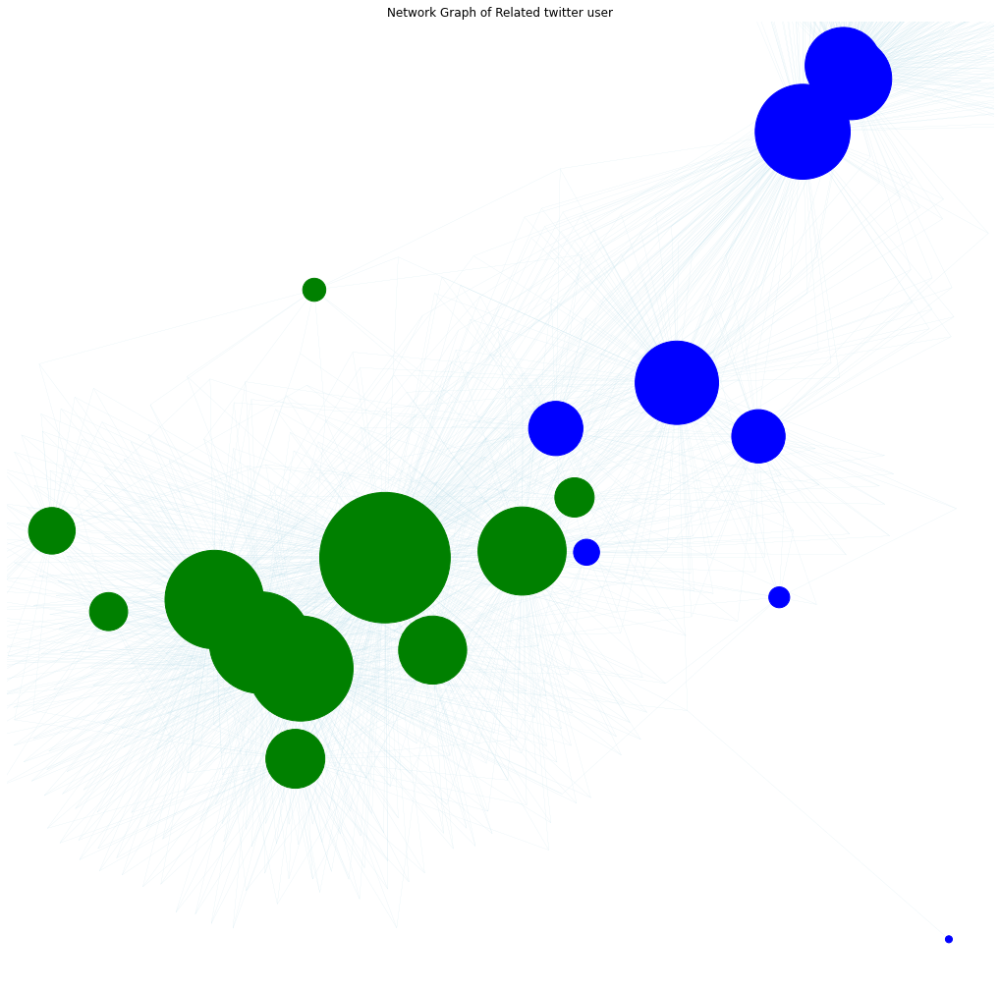

In [242]:
import matplotlib.pyplot as plt


plt.figure(figsize=(18, 18))

# Create the graph from the dataframe
g = nx.from_pandas_edgelist(edges, source='source', target='target') 

# Create a layout for nodes 
layout = nx.spring_layout(g,k=0.1, iterations=100,scale=1)

# Draw the parts we want, edges thin and grey
# Influencers appear small and grey
# Subreddits appear in blue and sized according to their respective number of connections.
# Labels for subreddits ONLY
# People who have more connections are highlighted in color 

# Go through every subbreddit, ask the graph how many connections it has. 
# Multiply that by 80 to get the circle size

sub_size = [g.degree(sub) * 50 for sub in subs]
'''
color_map = []
for node in range(0,len(subs)):
    if node < 10:
        color_map.append('blue')
    else:
        color_map.append('green')
'''  
nx.draw_networkx_nodes(g, 
                       layout, 
                       nodelist=subs,node_size=sub_size, node_color= color_map)





nx.draw_networkx_edges(g, layout, width=0.1, edge_color="lightblue")

#nx.draw_networkx_labels(g, layout, labels=node_labels)

# No axis needed
plt.axis('off')
plt.title("Network Graph of Related twitter user")
plt.savefig("NetworkGraph", bbox_inches='tight',pad_inches=2)
plt.show()

In [23]:
edges["n_weights"] = (edges[["mention_weights"]] > 0).sum(axis="columns")
edges["n_weights"]

0       1
1       1
2       1
3       1
4       1
       ..
2173    1
2174    1
2175    1
2176    1
2177    1
Name: n_weights, Length: 2178, dtype: int64

In [28]:
node_map = {row.index : row.username for row in nodes.itertuples()}

node_map_inv = {v : k for (k, v) in node_map.items()}

edge_map = {row.Index : (row.source_id, row.target_id) for row in edges.itertuples()}
edge_map_inv = {v : k for (k, v) in edge_map.items()}

In [29]:
rt_weights, reply_weights, mention_weights, n_weights = {}, {}, {}, {}

for edge in edges.itertuples():
    mention_weights[(edge.source_id, edge.target_id)] = edge.mention_weights
    n_weights[(edge.source_id, edge.target_id)] = edge.n_weights

In [30]:
g = gt.Graph()
g.add_vertex(len(node_map))
for edge in edge_map:
    source, target = edge_map[edge]
    g.add_edge(g.vertex(source), g.vertex(target))

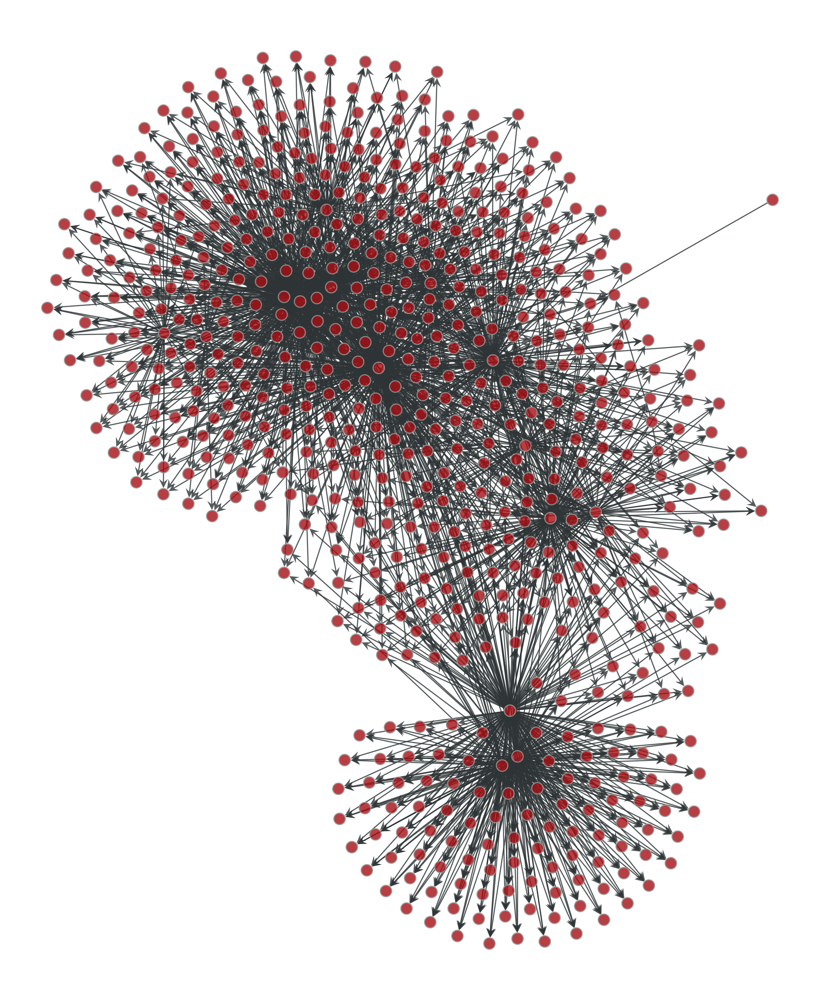

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc281122cd0, at 0x7fc281122d60>

In [31]:
pos = gt.sfdp_layout(g)
gt.graph_draw(g, pos=pos, output_size=(2000,2000))

In [32]:
vertex_name = g.new_vertex_property("string", vals=nodes['username'].values)

# Edge Properties (Weights)

mention_weights_pm = g.new_edge_property("float", vals=[i[1] for i in sorted(mention_weights.items())])
n_weights_pm = g.new_edge_property("float", vals=[i[1] for i in sorted(n_weights.items())])

## Log Edge Properties
mention_weights_log_pm = g.new_edge_property("float", vals=[np.log1p(i[1]) for i in sorted(mention_weights.items())])

# Make Property Maps Internal to Graph
g.vertex_properties["vertex_name"] = vertex_name
g.edge_properties["mention_weights"] = mention_weights_pm
g.edge_properties["n_weights"] = n_weights_pm
g.edge_properties["mention_weights_log"] = mention_weights_log_pm

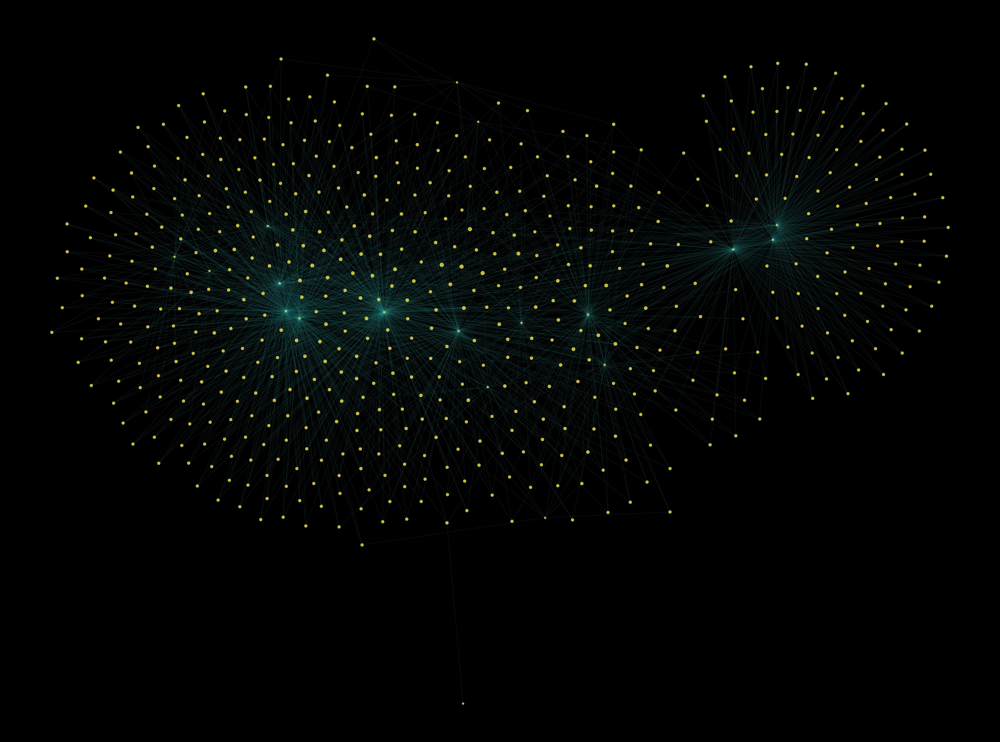

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc281122550, at 0x7fc281096d90>

In [33]:
largest_comp = gt.GraphView(g, vfilt=gt.label_largest_component(g, directed=False))
largest_comp = gt.Graph(largest_comp, prune=True)

pos = gt.sfdp_layout(largest_comp)

deg = largest_comp.degree_property_map("in")

gt.graph_draw(
    largest_comp,
    pos=pos,
    output_size=(2000, 2000),
    vertex_fill_color=[*matplotlib.cm.viridis.colors[-1], .8],
    vertex_size=gt.prop_to_size(deg, mi=4, ma=8),
    vertex_color=[1, 1, 1, 0.5],
    edge_color=[*matplotlib.cm.viridis.colors[128], .6],
    edge_pen_width=gt.prop_to_size(largest_comp.ep["n_weights"], mi=0.2, ma=1, power=1),
    bg_color=[0, 0, 0, 1],
)


Mention


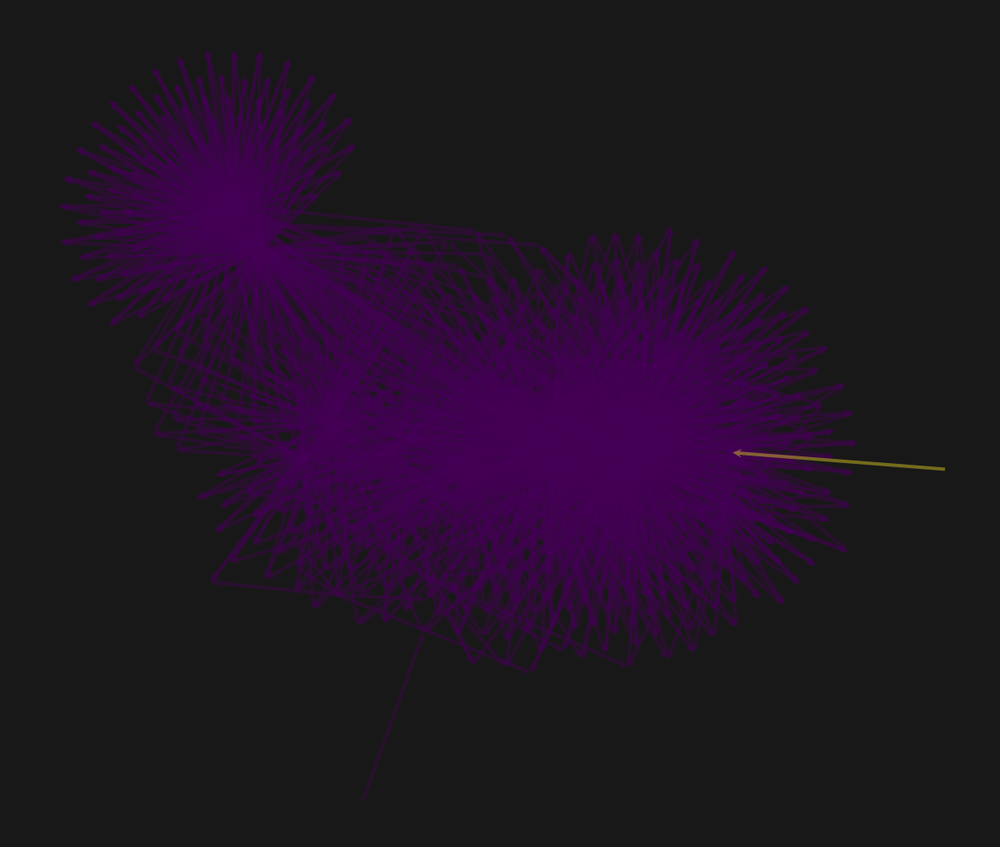

In [21]:
edge_weights_log_iter = [

    ("Mention", "mention_weights_log"),
    
]

for weight in edge_weights_log_iter:
    print(weight[0])
    eprop = largest_comp.ep[weight[1]]
    vfilt = largest_comp.degree_property_map("total", weight=eprop).a != 0.0
    efilt = eprop.a > 0.0
    view = gt.GraphView(largest_comp, vfilt=vfilt, efilt=efilt)
    gt.graph_draw(
        view,
        pos=pos,
        output_size=(600, 600),
        edge_color=eprop,
        ecmap=(matplotlib.cm.viridis, .4),
        eorder=eprop,
        edge_pen_width=2,
        vertex_size=0,
        bg_color=[0, 0, 0, .9],
    )